In [2]:
import colorsys
from pathlib import Path

import numpy as np
import cv2
import matplotlib.pyplot as plt


In [3]:
COLORS = [
    {
        "name": "red1",
        "hex": "#ff0000",
        "hue": 0
    },
    {
        "name": "orange",
        "hex": "#ff8000",
        "hue": 30
    },
    {
        "name": "yellow",
        "hex": "#ffff00",
        "hue": 60
    },
    {
        "name": "chartreuse",
        "hex": "#80ff00",
        "hue": 90
    },
    {
        "name": "green",
        "hex": "#00ff00",
        "hue": 120
    },
    {
        "name": "spring-green",
        "hex": "#00ff80",
        "hue": 150
    },
    {
        "name": "cyan",
        "hex": "#00ffff",
        "hue": 180
    },
    {
        "name": "azure",
        "hex": "#0080ff",
        "hue": 210
    },
    {
        "name": "blue",
        "hex": "#0000ff",
        "hue": 240
    },
    {
        "name": "violet",
        "hex": "#8000ff",
        "hue": 270
    },
    {
        "name": "magenta",
        "hex": "#ff00ff",
        "hue": 300
    },
    {
        "name": "rose",
        "hex": "#ff0080",
        "hue": 330
    },
    {
        "name": "red2",
        "hex": "#ff0000",
        "hue": 360
    }
]



In [4]:
image_path = Path("~/.wallpaper").expanduser()
# image_path = Path("~/Pictures/Wallpapers/wallpaper14.jpg").expanduser()
# image_path = Path("~/Pictures/shibari.jpg").expanduser()

image_raw = cv2.imread(image_path)


needable_size = 1000

height, width, _ = image_raw.shape
max_side = max(width, height)

if max_side > 2 * needable_size:
    scale = needable_size / max_side

    image_raw = cv2.resize(image_raw, (int(width * scale), int(height * scale)), interpolation=cv2.INTER_AREA)


image_rgb = cv2.cvtColor(image_raw, cv2.COLOR_BGR2RGB) / 255
image_hsv = cv2.cvtColor(image_raw, cv2.COLOR_BGR2HSV) / 255
image_hsv[..., 0] *= np.pi * 2

HEIGHT, WIDTH = image_raw.shape[0], image_raw.shape[1]
TOTAL_PIXELS = image_raw.shape[0] * image_raw.shape[1]

print(HEIGHT, WIDTH)
print(TOTAL_PIXELS)


562 1000
562000


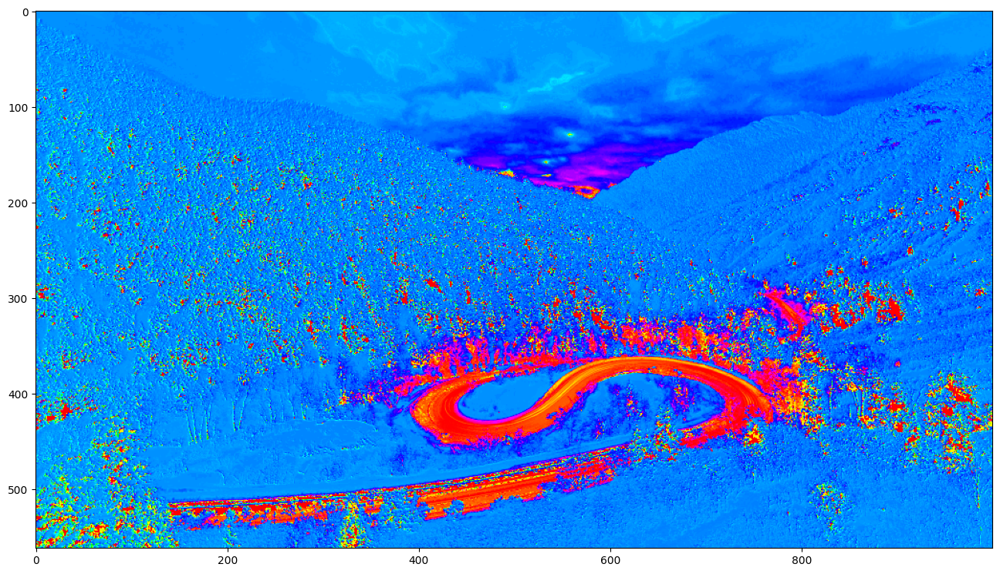

In [5]:
hue, saturation, value = cv2.split(image_hsv)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16, 16))

ax.imshow(hue, cmap="hsv")

L: [0.000, 1.000]
a: [-0.150, 0.646]
b: [-0.433, 0.724]


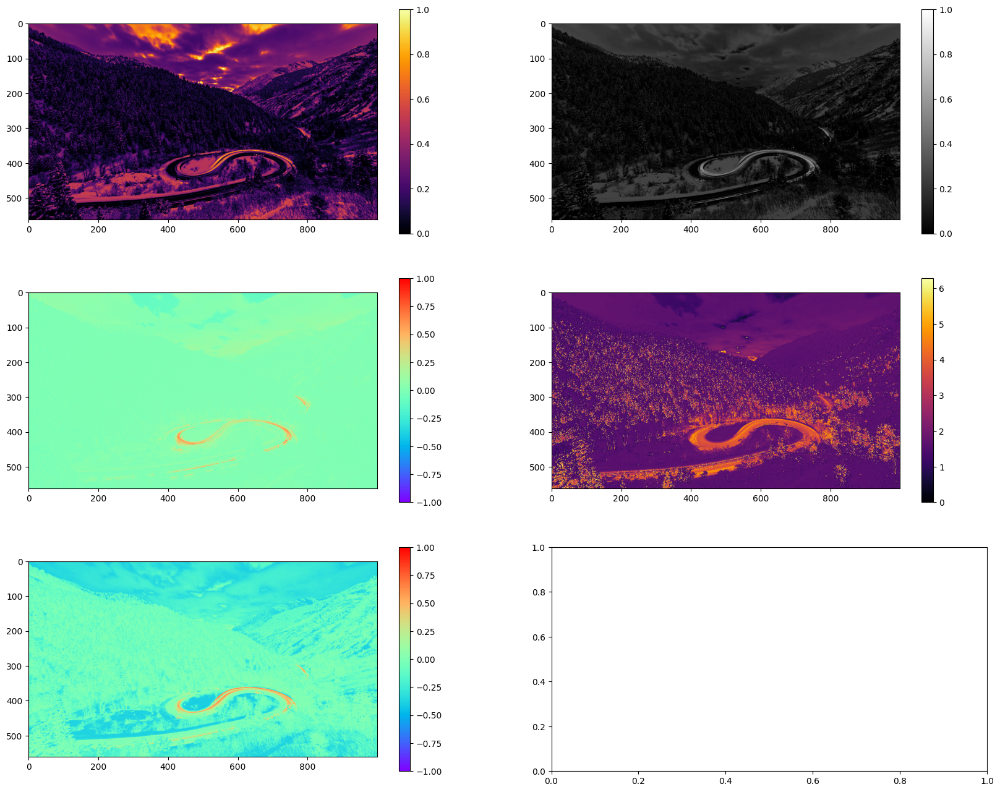

In [6]:
image_lab = cv2.cvtColor(image_raw, cv2.COLOR_BGR2LAB).astype(np.float32)
image_lab[..., 0] = image_lab[..., 0] / 255.0
image_lab[..., 1] = (image_lab[..., 1] - 128.0) / 127.0
image_lab[..., 2] = (image_lab[..., 2] - 128.0) / 127.0

chroma = np.hypot(image_lab[..., 1], image_lab[..., 2]) / np.sqrt(2)
hue = np.arctan2(image_lab[..., 2], image_lab[..., 1]) + np.pi

print(f"L: [{image_lab[..., 0].min():.3f}, {image_lab[..., 0].max():.3f}]")
print(f"a: [{image_lab[..., 1].min():.3f}, {image_lab[..., 1].max():.3f}]") 
print(f"b: [{image_lab[..., 2].min():.3f}, {image_lab[..., 2].max():.3f}]")

fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 16))

imd00 = ax[0][0].imshow(image_lab[..., 0], cmap="inferno", vmin=0.0, vmax=1.0)
fig.colorbar(imd00, ax=ax[0][0])

imd01 = ax[0][1].imshow(chroma, cmap="gray", vmin=0.0, vmax=1.0)
fig.colorbar(imd01, ax=ax[0][1])

imd10 = ax[1][0].imshow(image_lab[..., 1], cmap="rainbow", vmin=-1.0, vmax=1.0)
fig.colorbar(imd10, ax=ax[1][0])

imd11 = ax[1][1].imshow(hue, cmap="inferno", vmin=0.0, vmax=np.pi * 2)
fig.colorbar(imd11, ax=ax[1][1])

imd20 = ax[2][0].imshow(image_lab[..., 2], cmap="rainbow", vmin=-1.0, vmax=1.0)
fig.colorbar(imd20, ax=ax[2][0])

In [7]:
r = np.arctan2(0, 1)
g = np.arctan2(0, -1)
b = np.arctan2(-1, 0)
y = np.arctan2(1, 0)
print("Red:", r)
print("Green:", g)
print("Blue:", b)
print("Yellow:", y)

Red: 0.0
Green: 3.141592653589793
Blue: -1.5707963267948966
Yellow: 1.5707963267948966


In [8]:
STANDART_THRESHOLDS_CHROMA = {
    "not-color": -0.001,
    "achromatic": 0.02,      # Полностью ахроматический - не отличим от серого
    "near-neutral": 0.06,    # Почти нейтральный - едва заметный оттенок
    "very-weak-color": 0.12, # Очень слабый цвет
    "weak-color": 0.18,     # Слабый цвет (пастельные тона)
    "medium-color": 0.30,   # Умеренный цвет
    "strong-color": 0.45,   # Сильный цвет
    "very-strong-color": 0.60, # Очень сильный цвет
    "vivid-color": 0.80,    # Яркий, насыщенный цвет
    "clear-color": 1.0
}

STANDART_THRESHOLDS_LIGHTNESS = {
    "black": -0.001,
    "very-dark": 0.20,      # Очень темный
    "dark": 0.35,           # Темный
    "medium-dark": 0.50,    # Средне-темный
    "medium": 0.65,         # Средний
    "medium-light": 0.80,   # Средне-светлый  
    "light": 0.90,          # Светлый
    "very-light": 0.95,     # Очень светлы
    "white": 1.0
}

In [9]:
items = list(STANDART_THRESHOLDS_CHROMA.items())
chroma_thresholds = {}
counts = 0
for i in range(len(STANDART_THRESHOLDS_CHROMA) - 1):
    p1, p2 = items[i], items[i + 1]
    chroma_mask = (chroma > p1[1]) & (chroma <= p2[1])
    chroma_thresholds[p2[0]] = chroma_mask
    counts += np.sum(chroma_mask)
    print(p2[0], np.sum(chroma_mask))

achromatic 125459
near-neutral 102202
very-weak-color 114845
weak-color 89336
medium-color 126120
strong-color 2656
very-strong-color 1382
vivid-color 0
clear-color 0


In [10]:
items = list(STANDART_THRESHOLDS_LIGHTNESS.items())
lightneess_thresholds = {}
counts = 0
for i in range(len(STANDART_THRESHOLDS_LIGHTNESS) - 1):
    p1, p2 = items[i], items[i + 1]
    light_mask = (image_lab[..., 0] > p1[1]) & (image_lab[..., 0] <= p2[1]) & ~chroma_thresholds["achromatic"]
    lightneess_thresholds[p2[0]] = light_mask
    counts += np.sum(light_mask)
    print(p2[0], np.sum(light_mask))

very-dark 210519
dark 149609
medium-dark 50332
medium 16550
medium-light 7183
light 1842
very-light 397
white 109


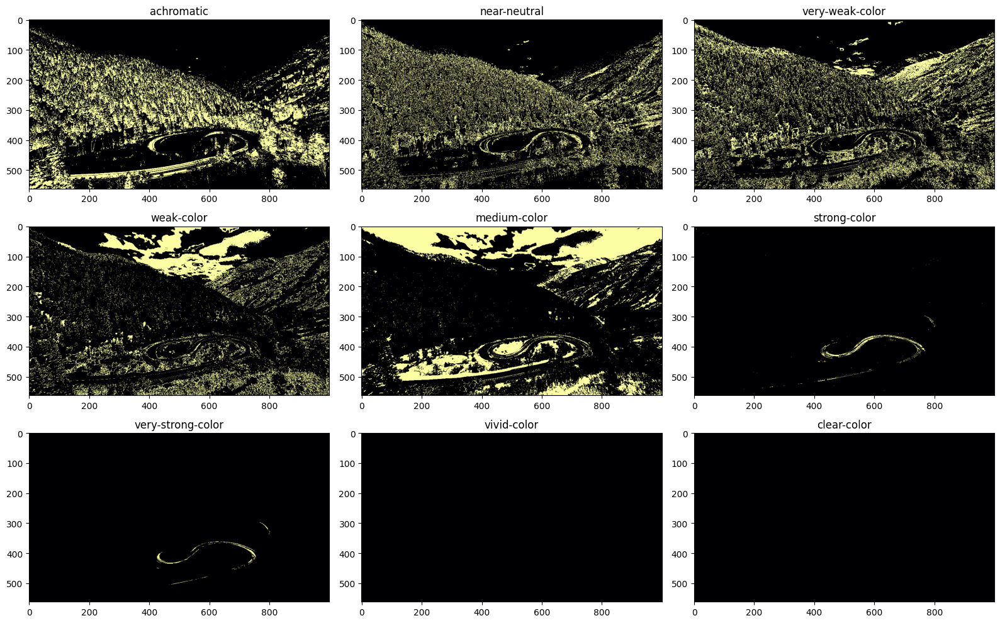

In [11]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(16, 10))

for i, (name, mask) in enumerate(chroma_thresholds.items()):
    lax = ax[i // 3][i % 3]
    lax.imshow(mask, cmap="inferno", vmin=0.0, vmax=1.0)
    lax.set_title(name)

fig.tight_layout()

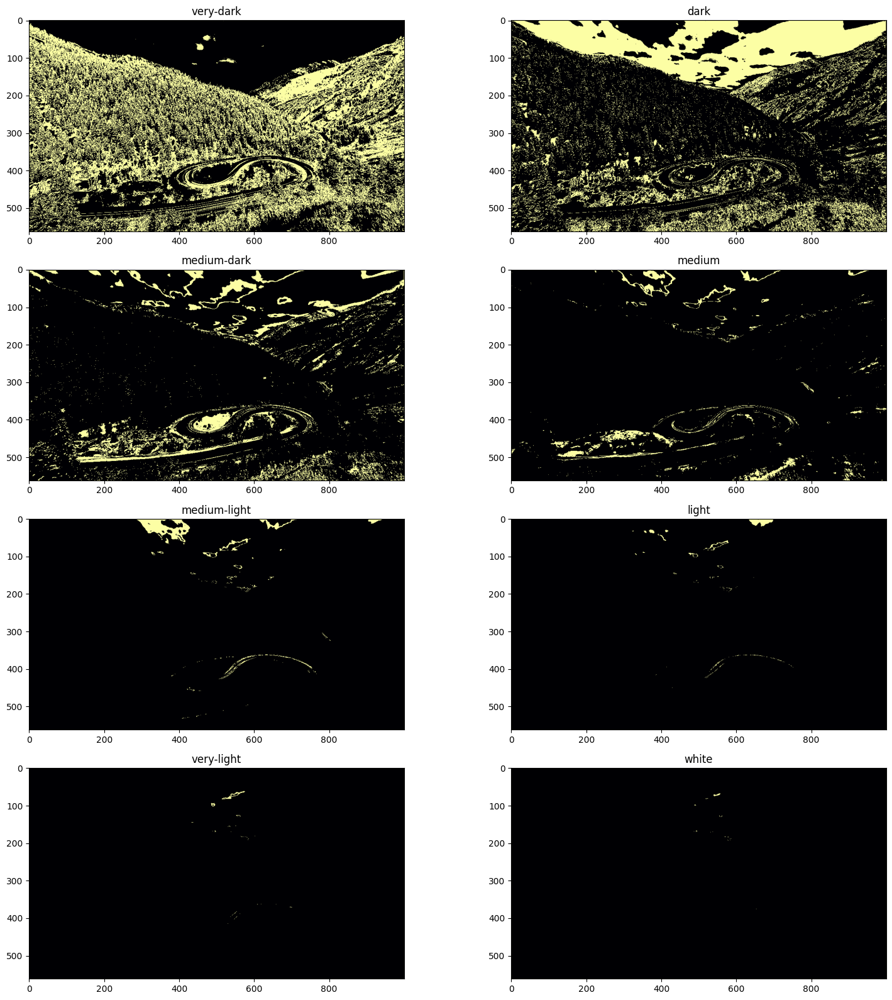

In [12]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16, 16))

for i, (name, mask) in enumerate(lightneess_thresholds.items()):
    lax = ax[i // 2][i % 2]
    lax.imshow(mask, cmap="inferno", vmin=0.0, vmax=1.0)
    lax.set_title(name)

fig.tight_layout()

In [13]:
data = np.concatenate([image_rgb, image_hsv, image_lab], axis=-1)

In [14]:
def get_colors_by_mask(data, mask):
    current_data = data[mask]
    count = current_data.shape[0]
    
    # sorting by Lightness
    current_data = current_data[np.argsort(current_data[..., 6])]

    size = np.ceil(np.sqrt(count)).astype(np.int32)

    colors = np.zeros((size, size, 3), dtype=np.float32)

    for i in range(count):
        colors[i // size, i % size] = current_data[i, :3]
    
    return current_data, colors

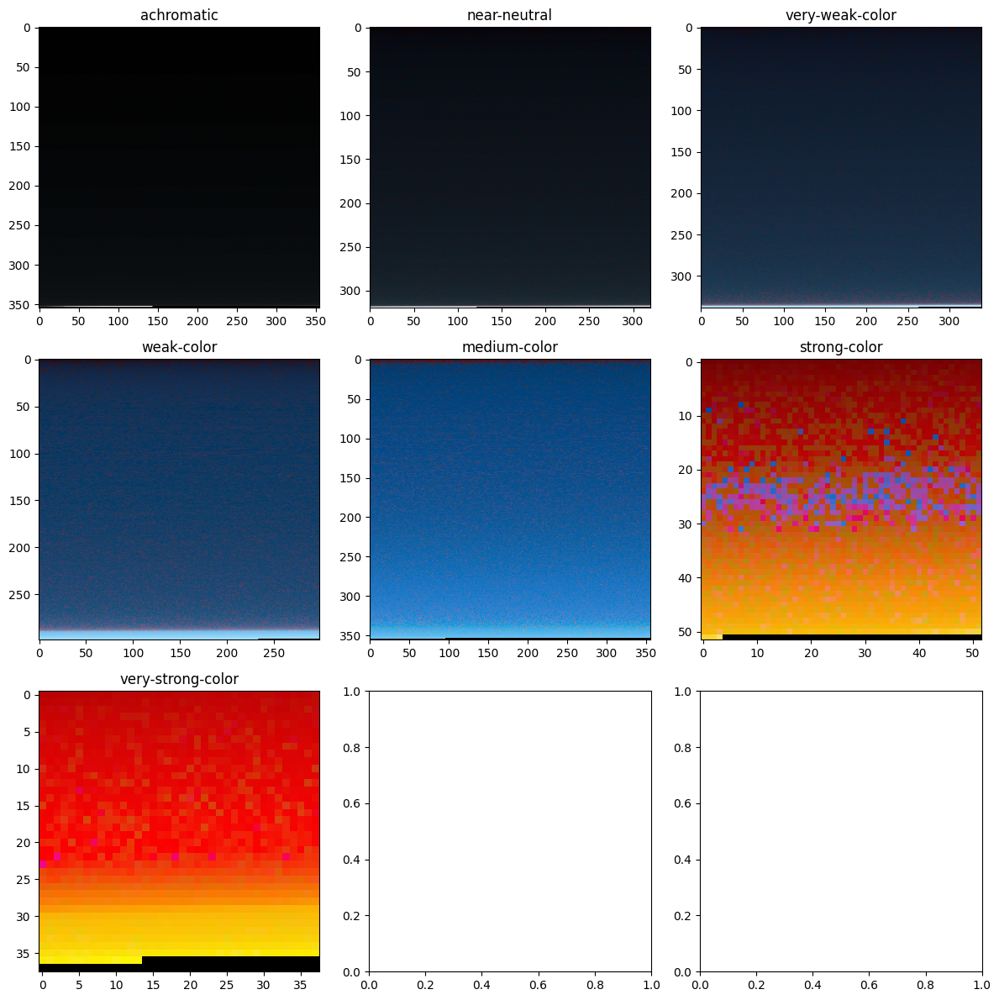

In [15]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))

chroma_colors = {}
for i, (name, mask) in enumerate(chroma_thresholds.items()):
    if not mask.any():
        continue
    lax = ax[i // 3][i % 3]
    local_data, local_colors = get_colors_by_mask(data, mask)
    chroma_colors[name] = local_data
    lax.imshow(local_colors)
    lax.set_title(name)

fig.tight_layout()

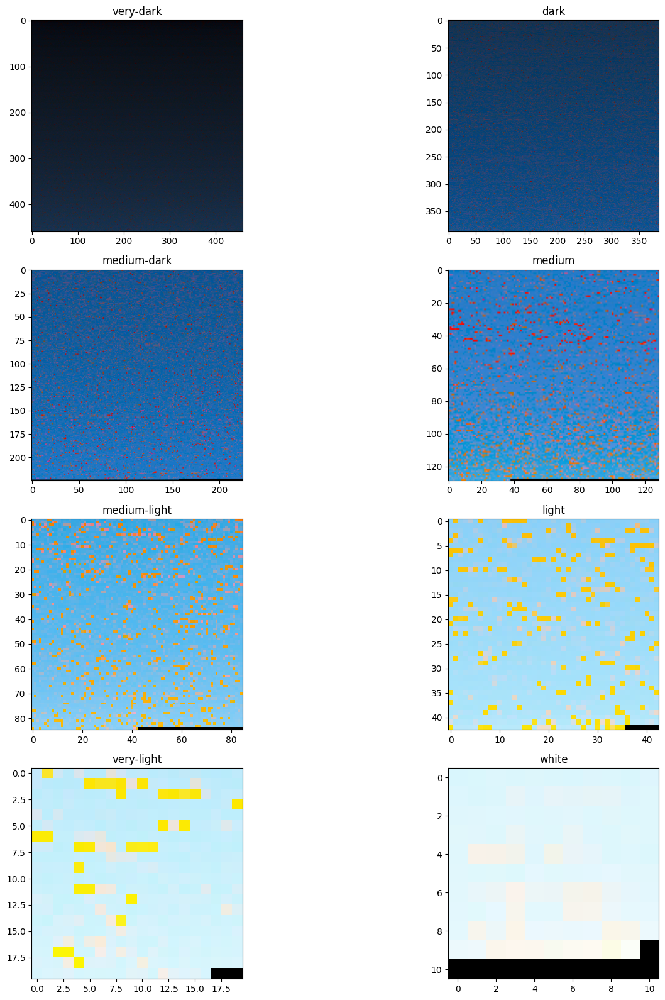

In [16]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16, 16))

lightness_colors = {}
for i, (name, mask) in enumerate(lightneess_thresholds.items()):
    if not mask.any():
        continue
    lax = ax[i // 2][i % 2]
    local_data, local_colors = get_colors_by_mask(data, mask)
    lightness_colors[name] = local_data
    lax.imshow(local_colors)
    lax.set_title(name)

fig.tight_layout()

In [17]:
hue_points = np.linspace(0, 2 * np.pi, 13)[:-1]
delta = np.pi / 12


def vectorized_kde(values, counts, x_range, bandwidth=0.3):
    x_grid = x_range[:, np.newaxis] 
    data_grid = values[np.newaxis, :]
    weights = counts / counts.sum()
    
    kernels = np.exp(-0.5 * ((x_grid - data_grid) / bandwidth)**2)
    kernels /= (bandwidth * np.sqrt(2 * np.pi))
    
    return np.dot(kernels, weights)

In [18]:
def get_stats_by_hue(colors):
    splitted = []
    val, cnt = np.unique(colors[:, 3], return_counts=True)
    for point in hue_points:
        masker = (val >= point - delta) & (val <= point + delta)
        val_ = val[masker]
        cnt_ = cnt[masker]

        splitted.append((val_, cnt_))
    
    return splitted

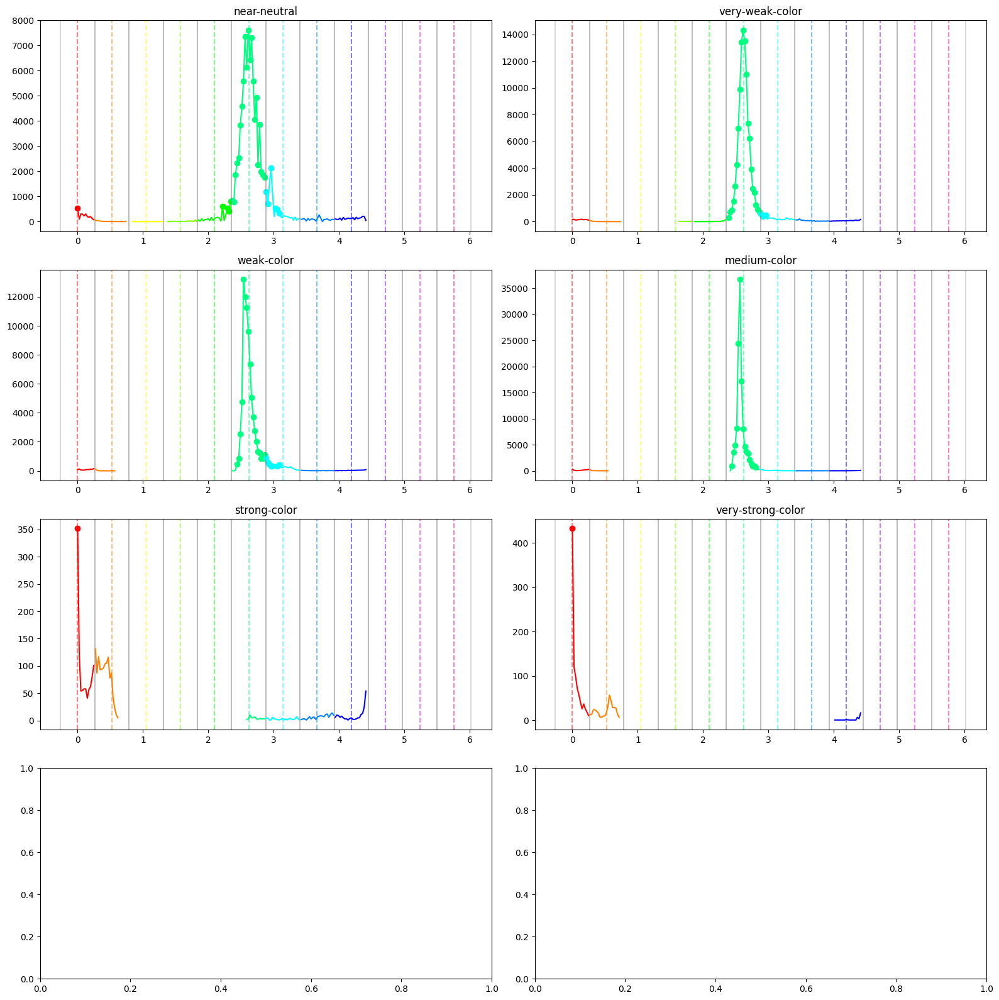

In [24]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16, 16))

X = np.linspace(0, 2 * np.pi, 13000)

for i, (name, colors) in enumerate(list(chroma_colors.items())[1:]):
    if not colors.any():
        continue
    lax = ax[i // 2][i % 2]
    stats = get_stats_by_hue(colors)
    for i, color in enumerate(COLORS[:-1]):
        lax.axvline(hue_points[i] - delta, color="gray", alpha=0.3)
        lax.axvline(hue_points[i] + delta, color="gray", alpha=0.3)
        lax.axvline(hue_points[i], color=color["hex"], linestyle="--", alpha=0.5)
        if stats[i][0].any():
            proportion = np.round(stats[i][1] / TOTAL_PIXELS * 100, 2)
            lax.scatter(stats[i][0][proportion > 0.05], stats[i][1][proportion > 0.05], color=color["hex"])
        lax.plot(stats[i][0], stats[i][1], color=color["hex"])
    lax.set_title(name)

fig.tight_layout()


very-dark red1 [0 5 8] [0.         0.12319971 0.19711954]
[[0.02352941 0.02352941 0.02352941 ... 0.01960784 0.         0.        ]
 [0.00784314 0.00784314 0.00784314 ... 0.00392157 0.         0.        ]
 [0.00784314 0.00784314 0.00784314 ... 0.00392157 0.         0.        ]
 ...
 [0.00392157 0.00392157 0.00392157 ... 0.00392157 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.00784314 0.00784314 0.00784314 ... 0.00392157 0.         0.        ]]
very-dark green [3 0 1] [1.92191551 1.84799568 1.87263562]
[[ 0.01568627  0.03529412  0.02745098 ...  0.02352941 -0.01574803
   0.00787402]
 [ 0.01176471  0.03137255  0.02352941 ...  0.01960784  0.
   0.        ]
 [ 0.01176471  0.03137255  0.02352941 ...  0.01960784  0.
   0.        ]
 ...
 [ 0.01960784  0.03921569  0.03137255 ...  0.02352941  0.
   0.        ]
 [ 0.05882353  0.07843137  0.07058824 ...  0.05882353 -0.01574803
   0.00787402]
 [ 0.05882353  0.19607843  0.14117647 ...  0.18039216

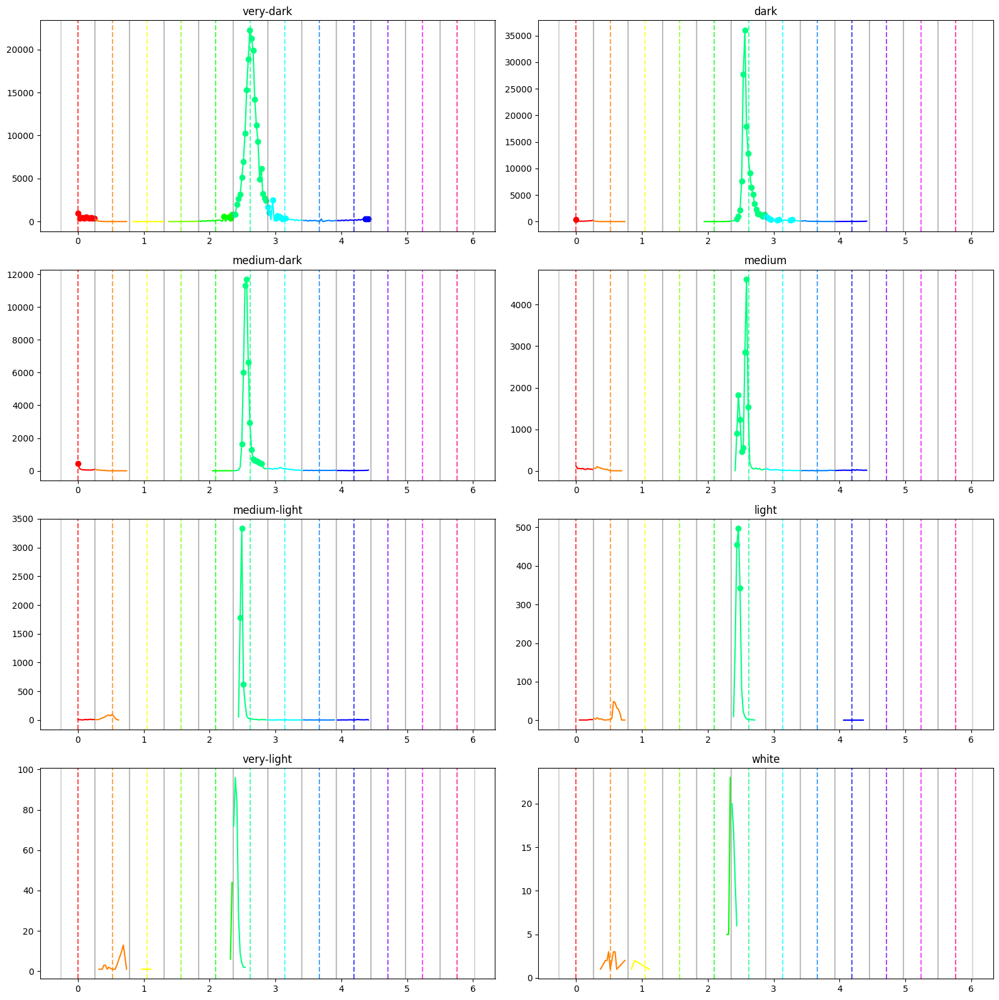

In [32]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16, 16))

for i, (name, colors) in enumerate(lightness_colors.items()):
    if not colors.any():
        continue
    lax = ax[i // 2][i % 2]
    stats = get_stats_by_hue(colors)
    for i, color in enumerate(COLORS[:-1]):
        lax.axvline(hue_points[i] - delta, color="gray", alpha=0.3)
        lax.axvline(hue_points[i] + delta, color="gray", alpha=0.3)
        lax.axvline(hue_points[i], color=color["hex"], linestyle="--", alpha=0.7)
        if stats[i][0].any():
            proportion = np.round(stats[i][1] / TOTAL_PIXELS * 100, 2)
            lmask = proportion > 0.05
            if lmask.any():
                lax.scatter(stats[i][0][lmask], stats[i][1][lmask], color=color["hex"])
                
                sorter = np.argsort(stats[i][1][lmask])[::-1]
                if len(sorter) > 3:
                    sorter = sorter[:3]
                print(name, color["name"], sorter, stats[i][0][sorter])
                print(data[data[..., 3] == stats[i][0][sorter][0]])
        lax.plot(stats[i][0], stats[i][1], color=color["hex"])
    lax.set_title(name)

fig.tight_layout()